In [23]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import math
from tqdm import tqdm
import seaborn as sns
from os import listdir
from os.path import isfile, join
%matplotlib inline

path = '/relevance2-nfs/chec/data/wheat/'
TRAIN_IMAGES_PATH = path+'train/'

In [16]:
DATA_DIR = '/relevance2-nfs/chec/data/wheat'

In [17]:
def plot_images(dataframe, show_bb = True, image_count = 16,idxs = [], image_label='image_id', bbox_label='bbox', n = 3):
    """This function can display any no of image in the grid size of 4 by no_of_images/4.
        Usage:-
            dataframe = The dataframe containing images and bounding boxes grouped into single list.
            show_bb = Show bounding boxes or not.
            imge_count = No of images to display (multiple of n).
            idxs =  If u want to pass your own indexes for ploting use this else pass [] an empty array. It will automatically select random images.
            image_label = Name of the column containing images in dataframe.
            bbox_label = Name of the column containing list of all bounding boxes per image in dataframe.
            n = Number of images per row.

        [NOTE]: If you want to convert stock train dataframe to desired format use the clean_data method. 
    """
    size = len(dataframe)
    image_count = image_count + (image_count % n)
    if len(idxs)==0:
        create_idx = True
    else:
        create_idx = False
        
    row_count = (int) (image_count / n)
    fig, ax = plt.subplots(row_count, n, figsize=(20,10))
    for i in range(image_count):
        x = (int)(i/n)
        y = i%n
        if create_idx:
            idx = random.randint(0, size-1)
            idxs.append(idx)
        else:
            idx = idxs[i]
        input_row = dataframe.iloc[idx]
        tuple_index = (x,y) if row_count > 1 else y
        ax[tuple_index].imshow(cv2.imread(TRAIN_IMAGES_PATH + input_row[image_label]))
        ax[tuple_index].set_title(input_row['image_id'])
        if show_bb:
            try:
                bbs = input_row[bbox_label]
                for bbox in bbs:    
                    rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=2,edgecolor='r',facecolor='none')
                    ax[tuple_index].add_patch(rect)
            except:
                pass
    fig.show()
    return idxs


def enlarge_image(dataframe, idx = -1, show_bb = True,image_label='image_id', bbox_label='bbox'):
    """This function is used to enlarge single image with or without bounding boxes.
        Usage:-
            dataframe = The dataframe containing images and bounding boxes grouped into single list.
            idx = The index of the image to be displayed. -1(default) means random selection.
            show_bb = Show bounding boxes or not.
            image_label = Name of the column containing images in dataframe.
            bbox_label = Name of the column containing list of all bounding boxes per image in dataframe.
        
        [NOTE]: If you want to convert stock train dataframe to desired format use the clean_data method. 
    """
    fig, ax = plt.subplots(figsize=(15,15))
    size = len(dataframe[dataframe['source']!='not_specified'])
    if idx==-1:
        idx = random.randint(0, size-1)
    input_row = dataframe.iloc[idx]
    tuple_index = (0,0)
    ax.imshow(cv2.imread(TRAIN_IMAGES_PATH + input_row[image_label]))
    ax.set_title(input_row[image_label])
    if show_bb:
        try:
            bbs = input_row[bbox_label]
            for bbox in bbs:    
                rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=2,edgecolor='r',facecolor='none')
                ax.add_patch(rect)
        except:
            pass
    fig.show()

def clean_data(train):
    dic = {}
    imgs = []
    bbs = []
    srcs = []
    tmp = []
    tn='---'
    for i in tqdm(train.iterrows()):
        img,_,_,bb,s = i[1]
        if tn=='---':
            tn = img
        elif tn == img:
            tmp.append(list(map(math.floor, list(map(float,bb.replace('[',"").replace(']',"").split(','))))))
        else:
            imgs.append(tn+'.jpg')
            bbs.append(tmp)
            srcs.append(s)
            tn = img
            tmp=[]
    imgs.append(tn)
    bbs.append(tmp)
    srcs.append(s)

    dic['image_id']=imgs
    dic['bbox'] = bbs
    dic['source'] = srcs

    train_clean = pd.DataFrame(dic)
    return train_clean

In [24]:
train = pd.read_csv(f'{path}train.csv')
sub = pd.read_csv(f'{path}sample_submission.csv')
train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [25]:
train_clean = clean_data(train)


"""Adding unlabeled images from train directory."""
dic = {}
onlyfiles = [f for f in listdir(path+'train') if isfile(join(path+'train', f))]
unlabeled = list(set(onlyfiles) - set(train_clean['image_id']))
dic['image_id'] = unlabeled
dic['bbox'] = [[] for i in range(len(unlabeled))]
dic['source'] = ['not_specified' for i in range(len(unlabeled))]
temp_clean = pd.DataFrame(dic)
train_clean = pd.concat([train_clean,temp_clean])

train_clean.head()

147793it [00:13, 10986.35it/s]


,image_id,bbox,source
0,b6ab77fd7.jpg,"[[226, 548, 130, 58], [377, 504, 74, 160], [83...",usask_1
1,b53afdf5c.jpg,"[[331, 863, 70, 95], [47, 226, 65, 46], [682, ...",usask_1
2,7b72ea0fb.jpg,"[[285, 755, 31, 34], [126, 464, 65, 53], [363,...",usask_1
3,91c9d9c38.jpg,"[[688, 939, 61, 85], [639, 674, 83, 41], [562,...",usask_1
4,41c0123cc.jpg,"[[572, 757, 110, 74], [47, 481, 94, 86], [106,...",usask_1


In [68]:
train_clean.shape

(3423, 3)

In [31]:
train.groupby('source')['image_id'].nunique()

source
arvalis_1    1055
arvalis_2     204
arvalis_3     559
ethz_1        747
inrae_1       176
rres_1        432
usask_1       200
Name: image_id, dtype: int64

In [27]:
train_clean['source'].value_counts()

arvalis_1        1055
ethz_1            747
arvalis_3         559
rres_1            432
arvalis_2         205
usask_1           199
inrae_1           176
not_specified      50
Name: source, dtype: int64

In [36]:
dict(train_clean['source'].value_counts())

{'arvalis_1': 1055,
 'ethz_1': 747,
 'arvalis_3': 559,
 'rres_1': 432,
 'arvalis_2': 205,
 'usask_1': 199,
 'inrae_1': 176,
 'not_specified': 50}

In [35]:
#counts = dict(train_clean['source'].value_counts())

#fig, ax = plt.subplots(figsize=(8,8));
#wedges, texts, autotexts = ax.pie(list(counts.values()), autopct='%1.1f%%',
#        shadow=True, startangle=90);
#ax.legend(wedges, list(counts.keys()),
#          title="Sources",
#          loc="center",
#          bbox_to_anchor=(1, 0, 0.5, 1));

#plt.setp(autotexts, size=15);

#ax.set_title("Data Distribution based on Sources");
#plt.show();
#sns.countplot(x='source', data=train_clean);

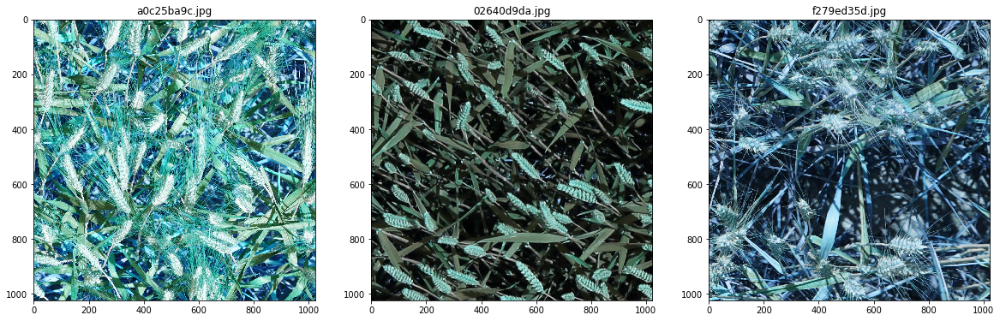

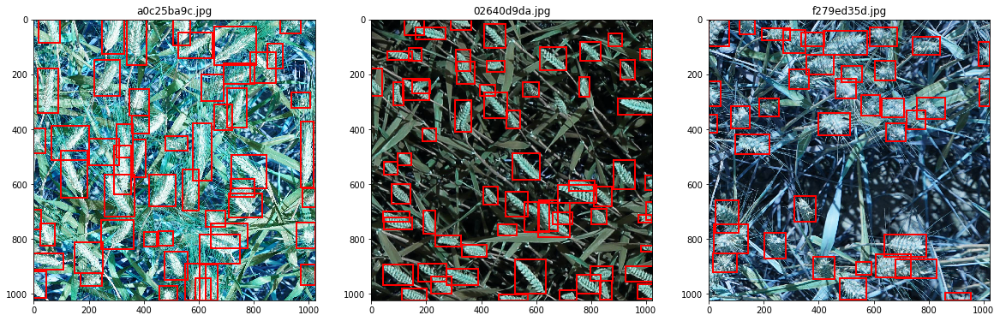

In [40]:
idxs = plot_images(train_clean, show_bb = False, image_count = 3);
plot_images(train_clean, show_bb = True,idxs = idxs, image_count = 3);

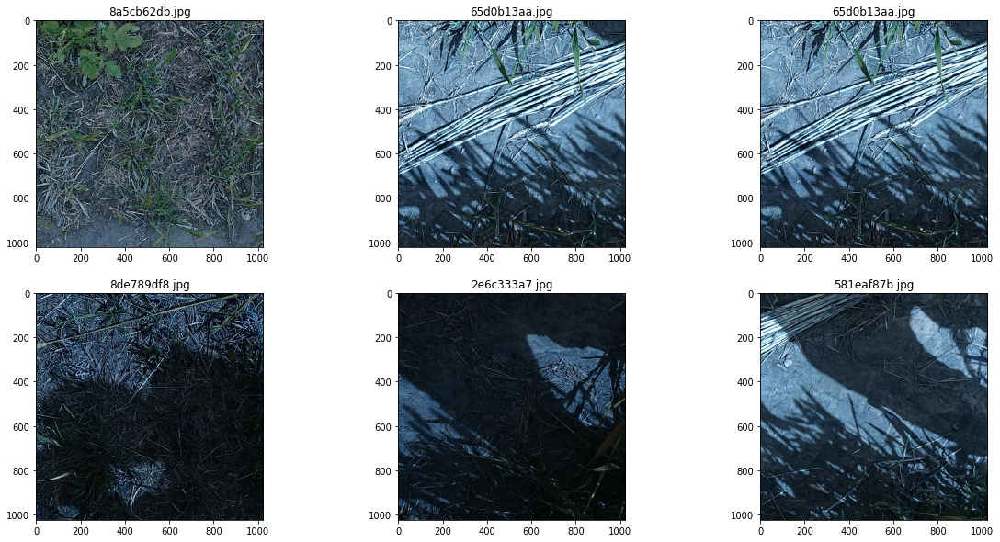

In [41]:
plot_images(train_clean[train_clean['source']=='not_specified'], idxs = [],show_bb = True, image_count = 6);

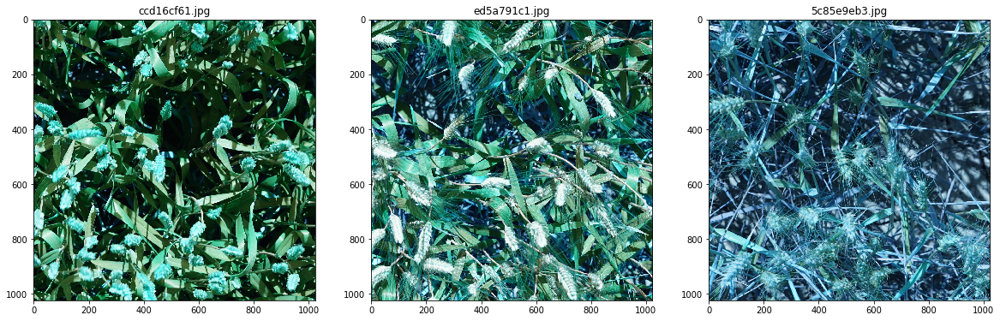

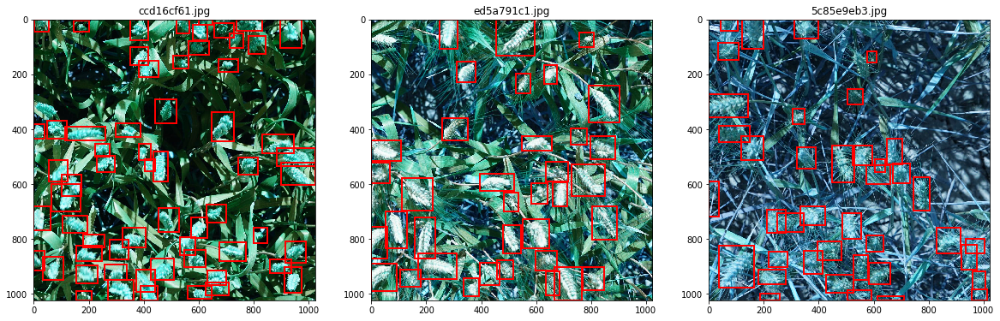

In [67]:
idxs = plot_images(train_clean[train_clean['source']=='arvalis_1'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='arvalis_1'], idxs = idxs, show_bb = True, image_count = 3);

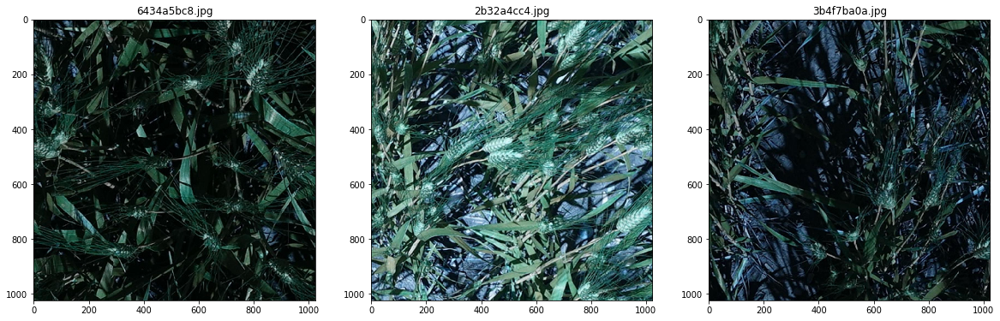

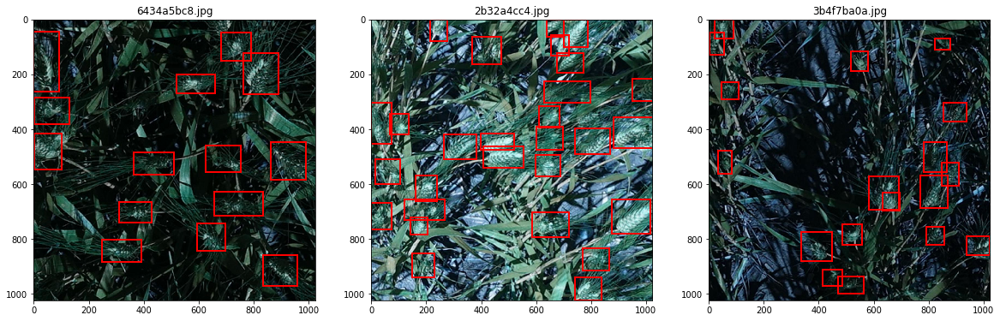

In [66]:
idxs = plot_images(train_clean[train_clean['source']=='arvalis_2'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='arvalis_2'], idxs = idxs, show_bb = True, image_count = 3);

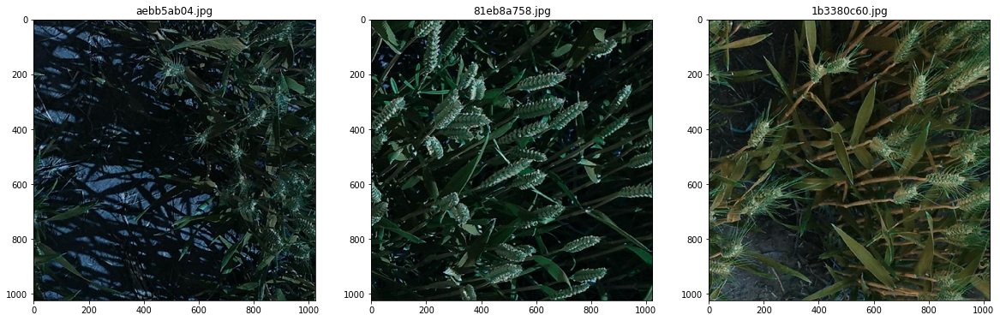

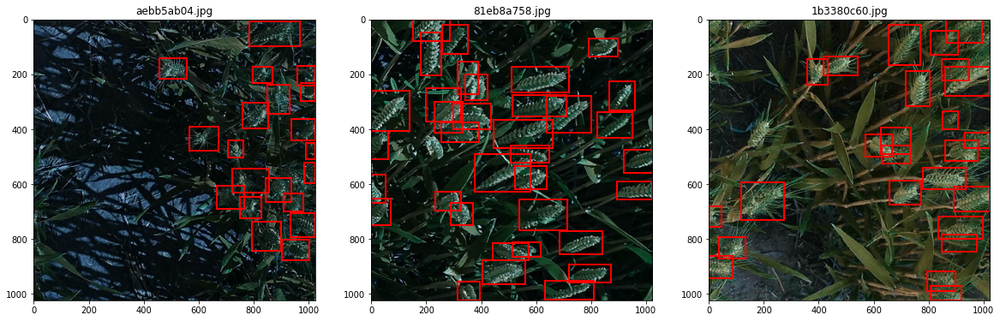

In [58]:
idxs = plot_images(train_clean[train_clean['source']=='arvalis_3'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='arvalis_3'], idxs = idxs, show_bb = True, image_count = 3);

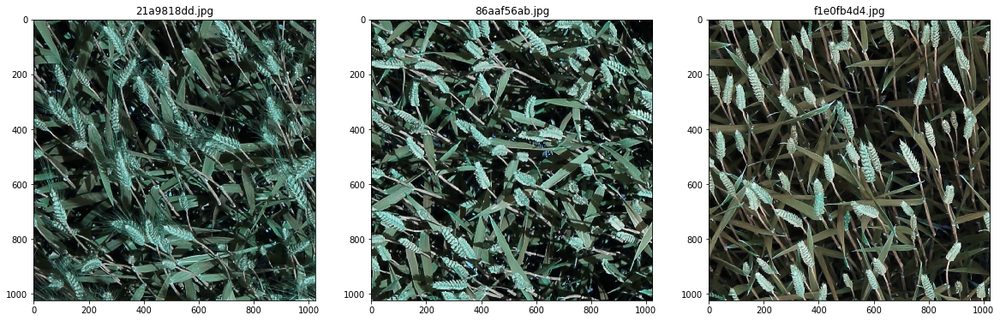

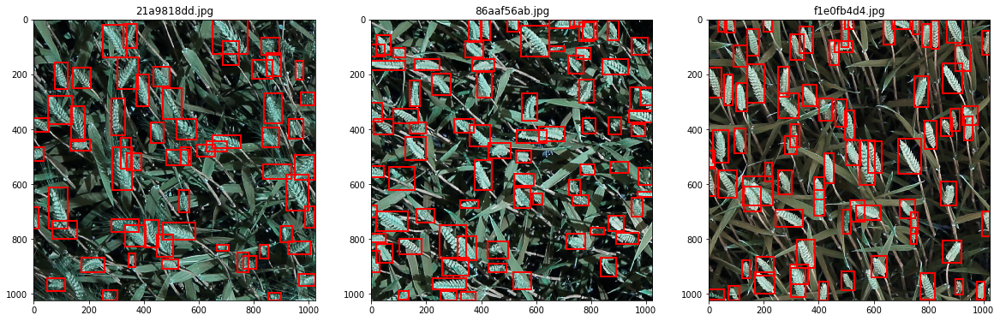

In [60]:
idxs = plot_images(train_clean[train_clean['source']=='ethz_1'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='ethz_1'], idxs = idxs, show_bb = True, image_count = 3);

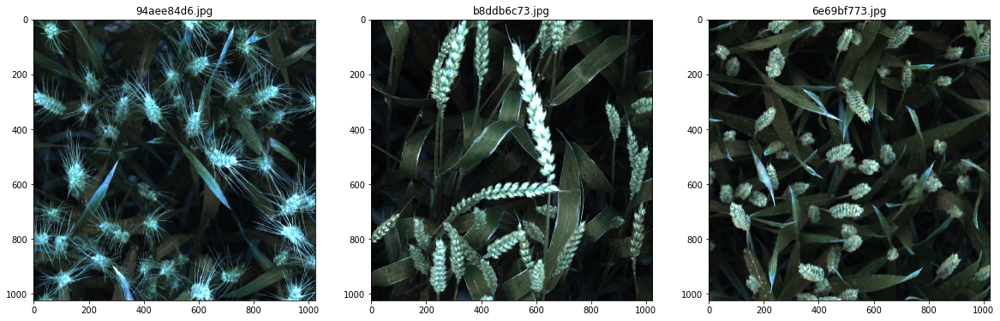

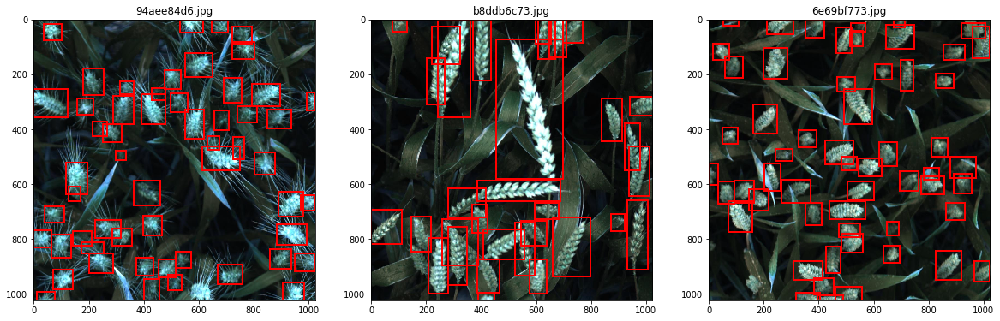

In [47]:
idxs = plot_images(train_clean[train_clean['source']=='rres_1'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='rres_1'], idxs = idxs, show_bb = True, image_count = 3);

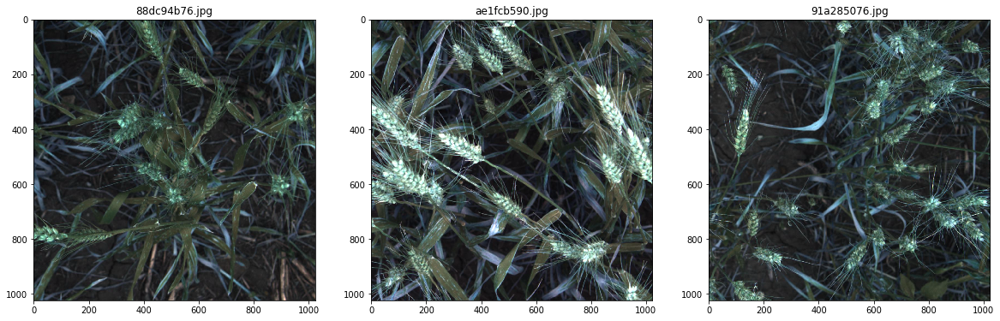

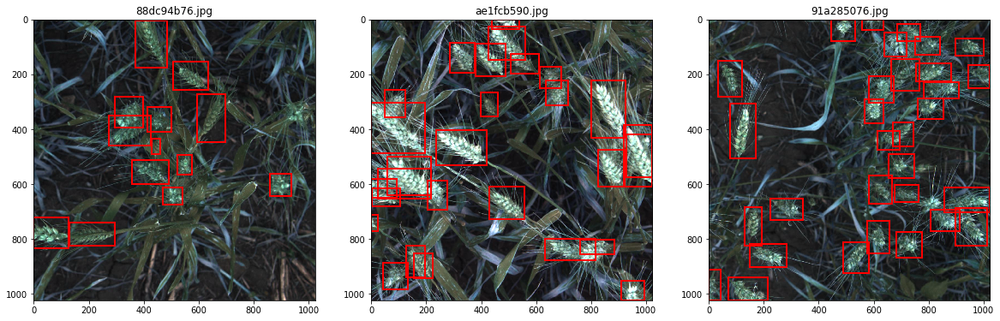

In [48]:
idxs = plot_images(train_clean[train_clean['source']=='usask_1'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='usask_1'], idxs = idxs, show_bb = True, image_count = 3);

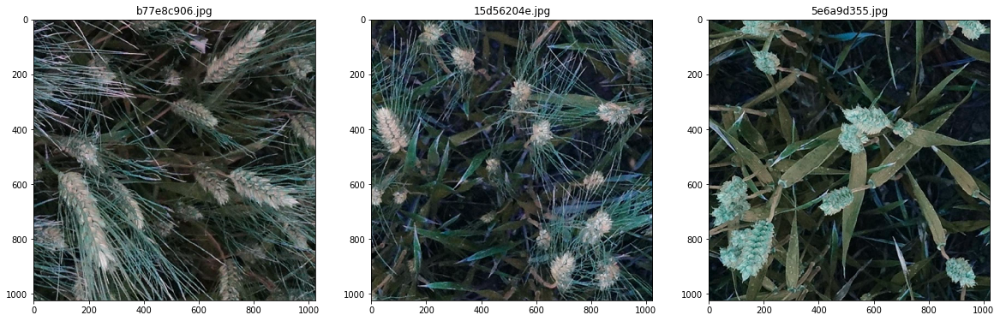

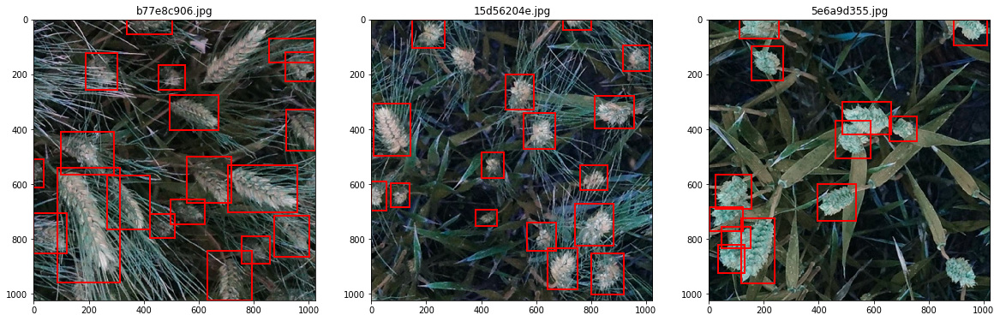

In [62]:
idxs = plot_images(train_clean[train_clean['source']=='inrae_1'], show_bb = False,idxs = [], image_count = 3);
plot_images(train_clean[train_clean['source']=='inrae_1'], idxs = idxs, show_bb = True, image_count = 3);